# Lab 1: Independent Component Analysis

### Machine Learning 2 (2017/2018)

* The lab exercises should be made in groups of two people.
* The deadline is Thursday, April 19, 23:59.
* Assignment should be submitted through BlackBoard! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [50]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


/home/tarun/miniconda3/envs/ai/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['f', 'norm']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [51]:
plt.rcParams["figure.figsize"] = (12, 12)

The following code generates some toy data to work with.

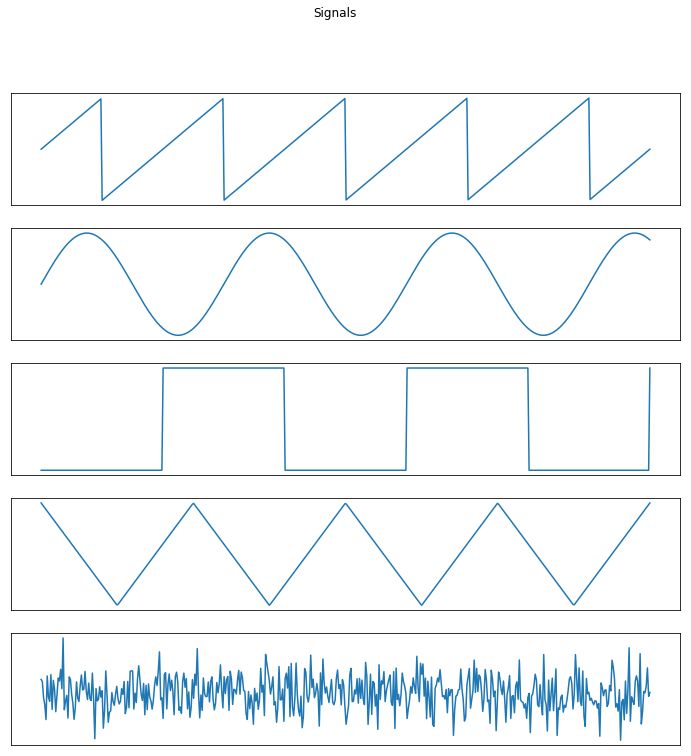

In [52]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [53]:
### 1.1 Make mixtures
def make_mixtures(S, A):
   
    # YOUR CODE HERE
    X = np.dot(A, S)
    return X
    

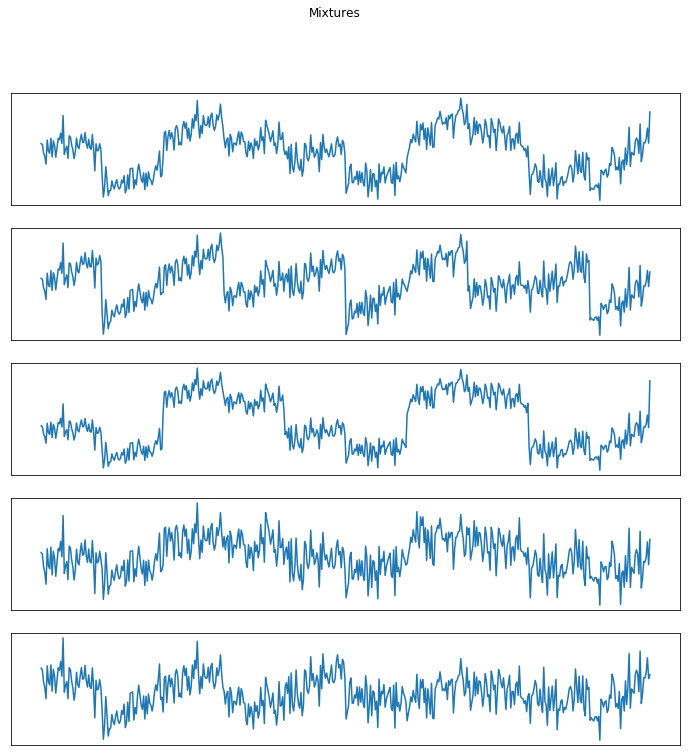

In [54]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

In [55]:
### 1.2 Histogram
from scipy.stats import norm
import matplotlib.mlab as mlab
def plot_histograms(X, title=None):
    
    f = plt.figure(figsize=(20,5))
    
    
    for i, row in enumerate(X):
        
        # the histogram of the data
          
        
        
        plt.subplot(1,X.shape[0], i + 1)
        (mu, sigma) = norm.fit(X[i,:])
        n, bins, patches = plt.hist(X[i,:], normed=True,facecolor='red', alpha=0.75)
        xt = plt.xticks()[0]  
        xmin, xmax = min(xt), max(xt)  
        lnspc = np.linspace(xmin, xmax, len(X[i,:]))

        
        # add a 'best fit' line
        
        y = norm.pdf( lnspc, mu, sigma)
        plt.plot(lnspc, y, 'g--', label="Norm",linewidth=2)
        
        plt.grid(True)
        plt.title(title+"_"+str(i+1))
    


/home/tarun/miniconda3/envs/ai/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


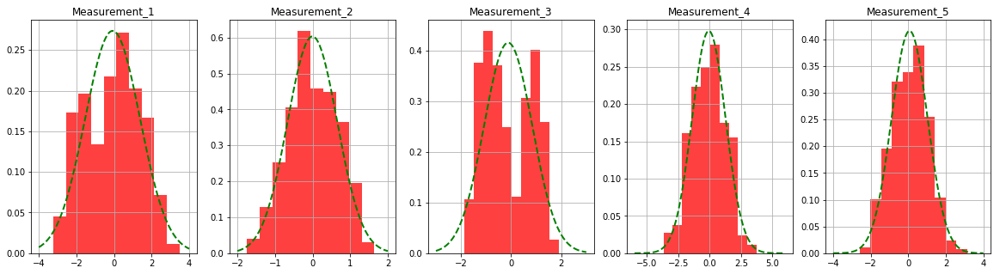

In [56]:
plot_histograms(X,title='Measurement')
plt.show()
plt.close()

/home/tarun/miniconda3/envs/ai/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


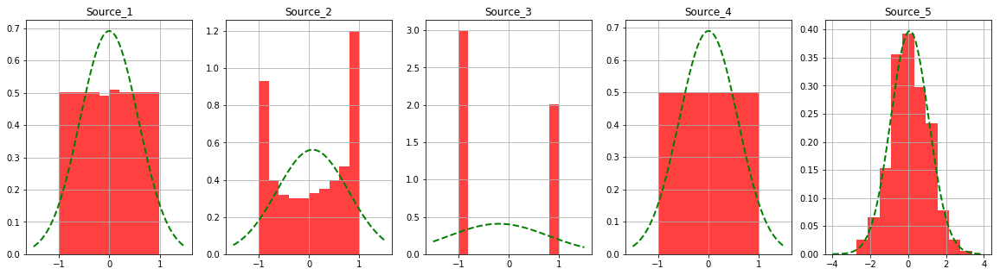

In [57]:
plot_histograms(S,"Source")

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

Measurements tends to look more like gaussian distribution, apart from that source signal are non-gaussian except the one. This phenomenon arises from the fact that ICA separation of mixed signals is based on two assumptions and three effects of mixing source signals. 

**Two assumptions**:
   1. The source signals are independent of each other.
   2.  The values in each source signal have non-Gaussian distributions.
   
**Three effects of mixing source signals**:
1. Independence: As per assumption 1, the source signals are independent; however, their signal mixtures are not. This is because the signal mixtures share the same source signals.
2. Normality: According to the Central Limit Theorem, the distribution of a sum of independent random variables with finite variance tends towards a Gaussian distribution. Loosely speaking, a sum of two independent random variables usually has a distribution that is closer to Gaussian than any of the two original variables. Here we consider the value of each signal as the random variable. That what we obsereve in histogram of "Measurements"
3. Complexity: The temporal complexity of any signal mixture is greater than that of its simplest constituent source signal.

It's important because ICA assume that there is at most one gaussian distribution, otherwise the constraint of variance = 1 makes two gaussian distributions unidentifiable.

## YOUR ANSWER HERE

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

YOUR ANSWER HERE
$$\phi(a) = \frac{d}{da} \ln p(a)$$

To calculate  probability density $p(a)$, we will follow these simple steps which will remian same for all the parts i.e
$$\int \phi(a)da = \int \frac{d}{da} \ln p(a)$$
$$\int \phi(a)da = \ln p(a) + C$$
$$\int \phi(a)da = \ln p(a) + C$$
$$ K+ \int \phi(a)da = \ln p(a)$$
$$\exp\big(K+\int \phi(a)da\big)= p(a)$$
$$\exp\big(\int \phi(a)da\big)\propto p(a)$$ 

**1** $$\phi_0(a) = -\tanh(a)$$
$$\exp\big(\int \phi(a)da\big)\propto p(a)$$ 
$$\exp\big(-\ln\left(\cosh\left(a\right)\right) +C)\propto p(a)$$
$$\exp\big(-\ln \cosh(a)\big)\propto p(a)$$
$$\exp\big(\ln\frac{1}{\cosh (a)}\big)\propto p(a)$$
$$\frac{1}{\cosh (a)}\propto p(a)$$

**2** $$\phi_1(a) = -a + \tanh(a)$$
$$\exp\big(\int -a + \tanh(a)da\big)\propto p(a)$$ 
$$\exp\big(\ln\left(\cosh\left(a\right)\right)-\dfrac{a^2}{2}+ C\big)\propto p(a)$$
$$\exp\big(\ln\left(\cosh\left(a\right)\right)-\dfrac{a^2}{2}\big)\propto p(a)$$
$$\exp(-\frac{a^{2}}{2})\exp\big( ln \cosh(a)\big)\propto p(a)$$
$$\exp(-\frac{a^{2}}{2})\cosh(a)\propto p(a)$$

**3** $$\phi_2(a) = -a^3$$
$$\exp\big(\int -a^{3}da\big)\propto p(a)$$
$$\exp\big(-\dfrac{a^4}{4}\big)\propto p(a)$$

**4** $$\phi_3(a) = -\frac{6a}{a^2 + 5}$$
$$\int \phi_3 (a)da  = \int - \frac{6a}{a^2 + 5}da $$
$$\text{Let} u = a^2 + 5 \implies da = \frac{1}{2a} du $$
$$\int \phi_3 (a) da  = \int - \frac{6a}{2a u} \ du $$
$$\int \phi_3 (a) da  = - 3 \int \frac{1}{u} \ du $$
$$\int \phi_3 (a) da  = - 3 \ln{u} + C$$
$$\int \phi_3 (a) da  = - 3 \ln(a^2 + 5) + C $$

$$\exp\big(\ln\left((a^2+5)^{-3}\right) \big) \propto p(a)$$
$$\exp\big(\ln\left((a^2+5)^{-3}\right) \big) \propto p(a)$$
$$ (a^2+5)^{-3}\propto p(a)$$


In [58]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    # YOUR CODE HERE
    return 1/np.cosh(a)

In [59]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    # YOUR CODE HERE
    return np.exp(-0.5*(a**2))*np.cosh(a)

In [60]:
def phi_2(a):
    return -a**3

def p_2(a):
    return np.exp(-4*(a**2))

In [61]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    # YOUR CODE HERE
    return (a**2 +5)**(-3)

In [62]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

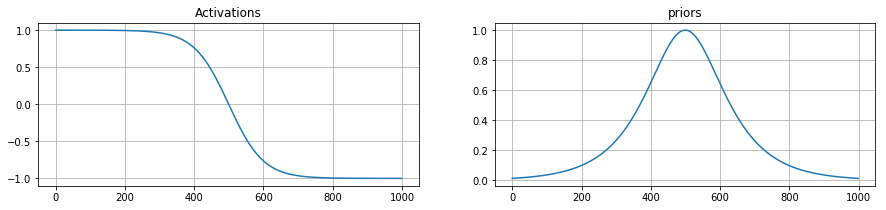

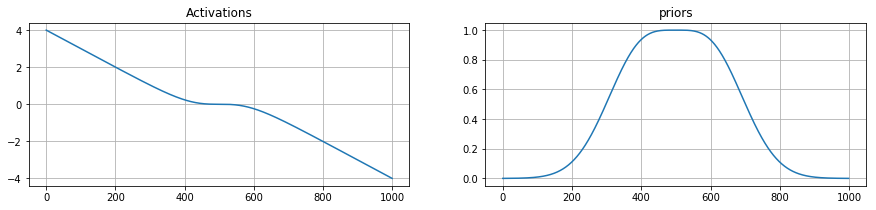

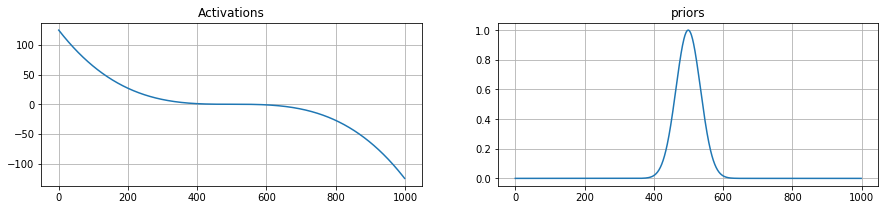

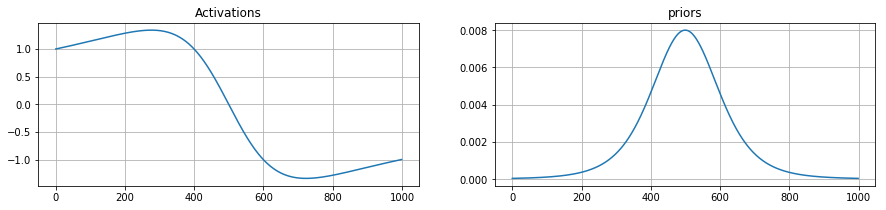

In [63]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

for idx, (func, pri) in enumerate(zip(activation_functions, priors)):
    f = plt.figure(figsize=(15,3))
    plt.subplot(1, 2, 1)
    plt.plot(func(a))
    plt.grid(True)
    plt.title("Activations")
    
    plt.subplot(1, 2, 2)
    plt.plot(pri(a))
    plt.grid(True)
    plt.title('priors')
    
    

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [64]:
### 1.4 Whitening
def whiten(X):
    # YOUR CODE HERE
    
    #Normalization
    X-= np.mean(X, axis=1,keepdims=1)
    
    #calculate covariance     
    cov = np.dot(X, X.T) / X.shape[1]
    #find basis to transorm the vectors     
    U,S,V = np.linalg.svd(cov)
    #Transform Data into new Basis
    X_tran = np.dot(U.T, X)
    
    #Whiten the data    
    S = S[:,None]
    #print(S)
    Xwhite =X_tran / np.sqrt(S + 1e-5)
      
    return Xwhite

In [65]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

In [66]:
### 1.5 Interpret results of whitening
# YOUR CODE HERE
def plotscatter(data,title=None):
    x = np.arange(0,data.shape[1])
    f = plt.figure(figsize=(20,15))
    
    index = 1
    for i in range(0,data.shape[0]):
        for j in range (0,data.shape[0]):
            plt.subplot(data.shape[0],data.shape[0],index)
            plt.scatter(data[i,:],data[j,:],marker = '.')
            plt.title("{}_{} and {}_{}".format(title,i,title,j))
            plt.grid(True)
            index += 1
    
    plt.show()

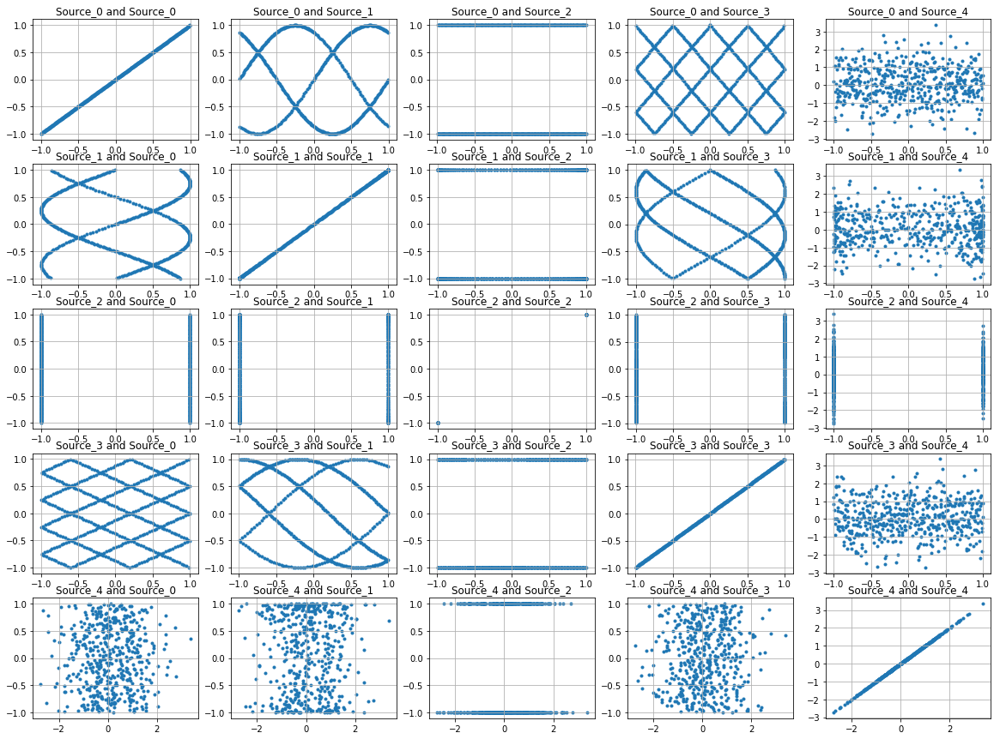

In [67]:
plotscatter(S,"Source")

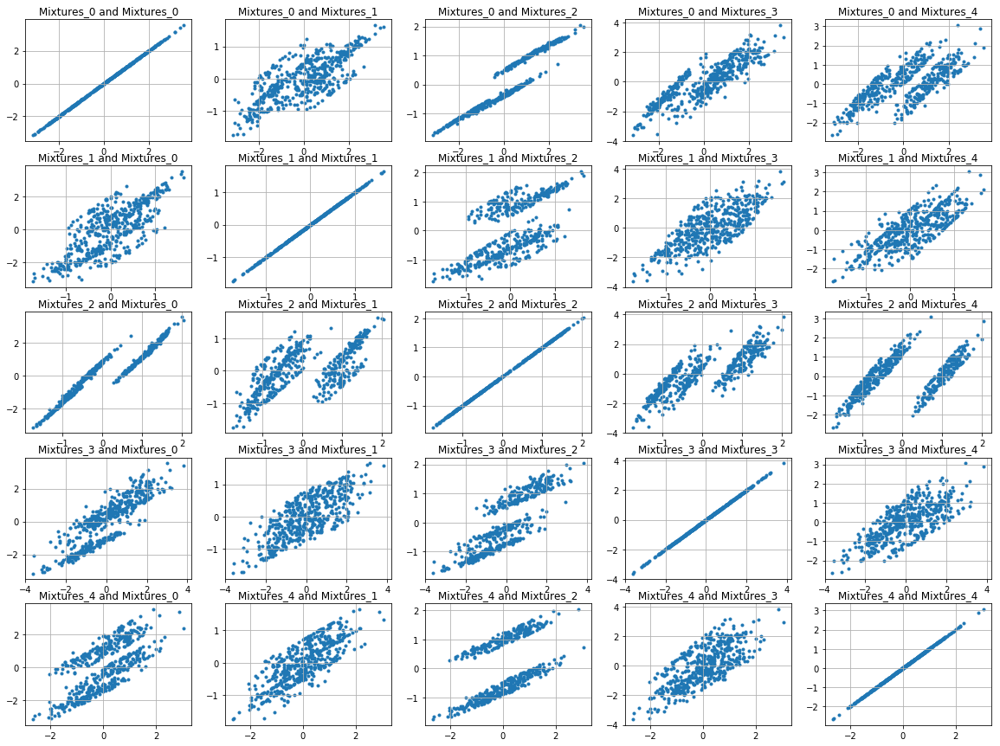

In [68]:
plotscatter(X,"Mixtures")

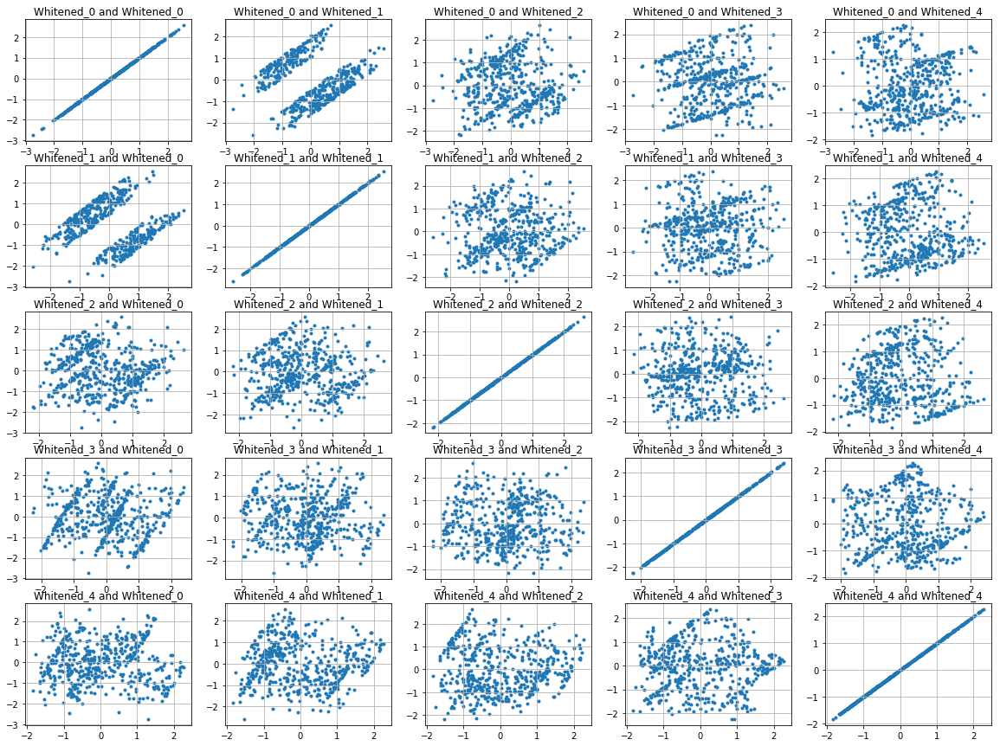

In [69]:
Xw = whiten(X)
plotscatter(Xw,"Whitened")

In the scatter plot of source signals, measurements and whitened measurements, we see the plot of data points of each signal with respect to another signal. The diagonal elements of the each 5x5 figures will correspond to comparision of signal to itself. In the first figure, row 1 and column 2 plot corresponds to scatter plot of sawtooth along x axis and sin_wave along y axis. The shape is as such because for each data point along x axis(sawtooth) the values taken by sine_wave 2-3 different values. Similar arguments can be made for all other plots.

As seen from scatter plot of measurements without whitening, the data are more dense with very less variation(higly correlated). After whitening, the data distribution is somewhat spreadout in all direction, i.e the variance is normalized in all direction.

Text(0.5,1,'Source')

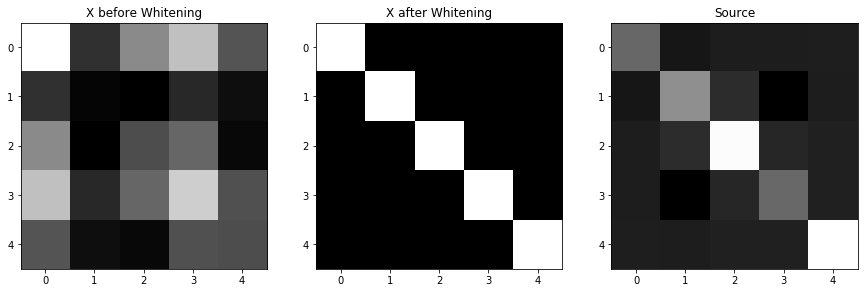

In [70]:
X1 = whiten(X)
f = plt.figure(figsize=(15,5))
cov1_mea = np.dot(X, X.T) / X.shape[1]
cov2_white = np.dot(X1, X1.T) / X.shape[1]
cov3_src = np.dot(S,S.T)/X.shape[1]

plt.subplot(1,3,1)
ax1 = imshow(cov1_mea, cmap='gray', interpolation='nearest')
plt.title("X before Whitening")
plt.subplot(1,3,2)
ax2 = imshow(cov2_white, cmap='gray', interpolation='nearest')
plt.title("X after Whitening")
plt.subplot(1,3,3)
ax3 = imshow(cov3_src, cmap='gray', interpolation='nearest')
plt.title("Source")

Are the signals independent after whitening?

As observed from covariance matrix of data after whitening it's an identity matrix. Making covariances zero i.e now our data is uncorrelated.In general independence implies uncorrelation but vice-versa doesn't hold. This holds only when joint distribution of random varibales are also gaussian.In our case we know our Measurements are approximatley normally distributed and they are dependent but we cann't comment on the joint distribution. Hence we can only say our Whitened X is uncorrelated. 

## YOUR ANSWER HERE

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

A prime example of a non-covariant algorithm is the popular steepest descents rule. A dimensionless
objective function $\mathcal{L(w)}$ is defined, its derivative with respect to some parameters $w$ is
computed, and then $\Delta w$ is changed by the rule:
$$\delta w_{i} = \eta \frac{\partial \mathcal{L}}{\partial w_{i}}$$

This popular equation is dimensionally inconsistent: the left hand side of this equation has dimensions
of $w_{i}$ and the right hand side has dimensions $1/w_i$. The behaviour of the learning algorithm
is not covariant with respect to linear rescaling of the vector \textbf{w}. To avoid this 
while updating our model parameters with iteration, we pick the $\Delta \omega$ which is covariant with respect to linear rescaling of $\w$.

If $\Delta w$ has the following property, the algorithm is a covariant algorithm:
$\Delta w_i = \eta \sum_{i'}M_{ii'} \frac{\partial L}{\partial w_i} $

The dimension of left-hand side and right-hand side with relative to $w$ are consistent now.

There are different ways to get this matrix, one is Newton's algorithm, another is to create a matrix with dimension $ w^2$


Repeat for each datapoint x:
1. Put x through a linear mapping:
$$a = \textbf{W}\textbf{x}$$
2. Put a through a nonlinear map:
$$z_i = \phi(a_i)$$,
where a popular choice for $\phi$ is $\phi$ = $−tanh(a_i)$.
3. Put a back through $\textbf{W}$:
$$x_0 = \textbf{W}^T\textbf{a}$$
4. Adjust the weights in accordance with
$$\Delta \textbf{W} ∝ \textbf{W} + \textbf{z}\textbf{x}_0$$

**NOTE** Algorithm is taken from Mackay book as it is.

## YOUR ANSWER HERE

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [94]:
### 1.7 Independent Component Analysis
def ICA(X, activation_function, learning_rate=0.1):
    np.random.seed(7)
    
    # YOUR CODE HERE
    W = np.random.rand(X.shape[0], X.shape[0]) * 0.02
    
    iter_ =30000
    for i in arange(iter_):
#         if np.remainder(i,100) == 0:
#             print(i)
        
        #initial_estimates of W
        a = np.dot(W,X)
        vect_act = np.vectorize(lambda a: activation_function(a))        

        z = vect_act(a)
        x_ = np.dot(W.T, a)
        grad = W + np.dot(z, x_.T)
        if (i+1) % 1000 == 0:
            print("gradient {} ,iterations{}: ".format(np.linalg.norm(grad), i))       
        #update weights
        W = W+learning_rate*(grad)
        if np.linalg.norm(grad)< 1e-5:
            print("Done!! Took {} iterations to converge".format(i+1))
            print("Final Gradient {}".format(np.linalg.norm(grad)))
            break
    print()
    return W



In [91]:
# optimal learning rate
W_estimates = [ICA(Xw, activation_function=phi,learning_rate=0.49) for phi in activation_functions]

gradient 1.736220286654161e-05 ,iterations999: 
gradient 1.464357983145709e-05 ,iterations1999: 
gradient 1.176178333879049e-05 ,iterations2999: 
Done!! Took 3705 iterations to converge
Final Gradient 9.999221890954406e-06

Done!! Took 194 iterations to converge
Final Gradient 9.91609533127697e-06

Done!! Took 169 iterations to converge
Final Gradient 9.999307576247458e-06

Done!! Took 14 iterations to converge
Final Gradient 9.033716645157954e-06



In [92]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


gradient 1.8583971470440236e-05 ,iterations999: 
gradient 1.8391501220145643e-05 ,iterations1999: 
gradient 1.810909931825829e-05 ,iterations2999: 
gradient 1.7745640622199193e-05 ,iterations3999: 
gradient 1.7312028375485812e-05 ,iterations4999: 
gradient 1.6820384245281994e-05 ,iterations5999: 
gradient 1.6283260692909063e-05 ,iterations6999: 
gradient 1.5712953235729342e-05 ,iterations7999: 
gradient 1.5120960834473124e-05 ,iterations8999: 
gradient 1.4517612678430017e-05 ,iterations9999: 
gradient 1.3911854925239153e-05 ,iterations10999: 
gradient 1.3311174374019552e-05 ,iterations11999: 
gradient 1.2721627821734342e-05 ,iterations12999: 
gradient 1.2147944447029629e-05 ,iterations13999: 
gradient 1.1593671747405453e-05 ,iterations14999: 
gradient 1.106134114598245e-05 ,iterations15999: 
gradient 1.055263567847138e-05 ,iterations16999: 
gradient 1.0068548057954265e-05 ,iterations17999: 
Done!! Took 18146 iterations to converge
Final Gradient 9.999963295671073e-06

Done!! Took 960 i

### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

gradient 1.736220286654161e-05 ,iterations999: 
gradient 1.464357983145709e-05 ,iterations1999: 
gradient 1.176178333879049e-05 ,iterations2999: 
Done!! Took 3705 iterations to converge
Final Gradient 9.999221890954406e-06

Done!! Took 194 iterations to converge
Final Gradient 9.91609533127697e-06

Done!! Took 169 iterations to converge
Final Gradient 9.999307576247458e-06

Done!! Took 14 iterations to converge
Final Gradient 9.033716645157954e-06



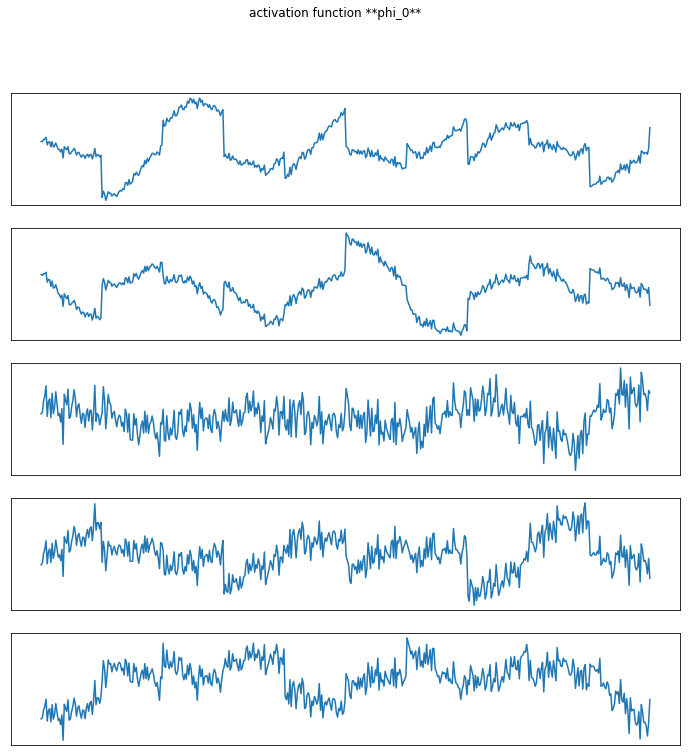

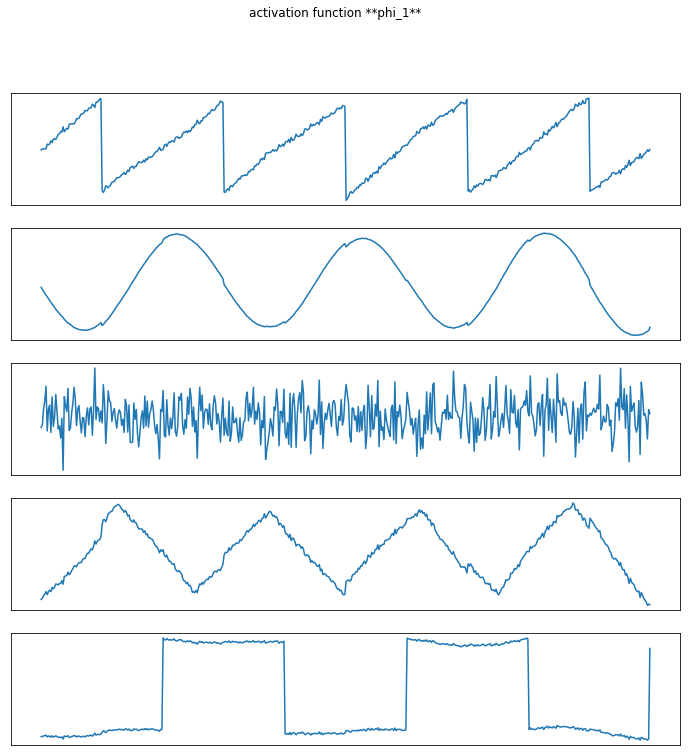

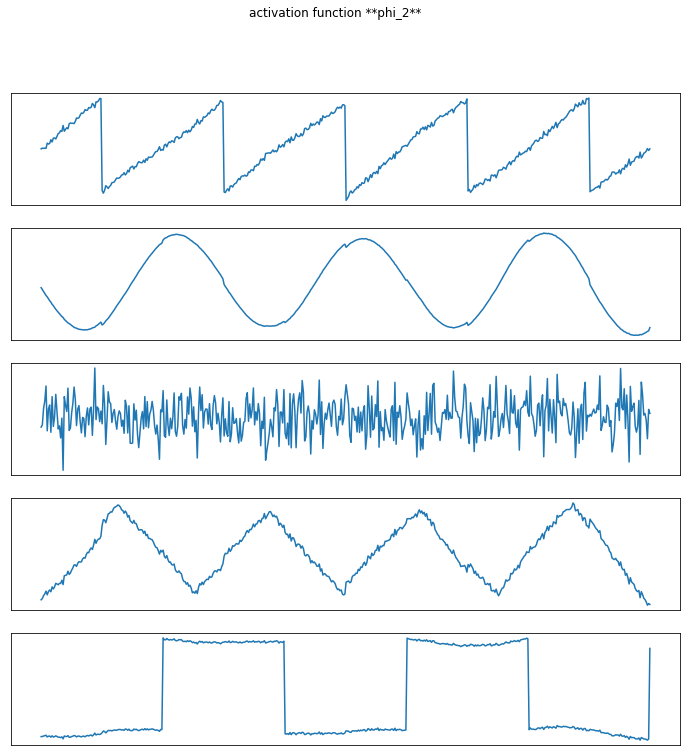

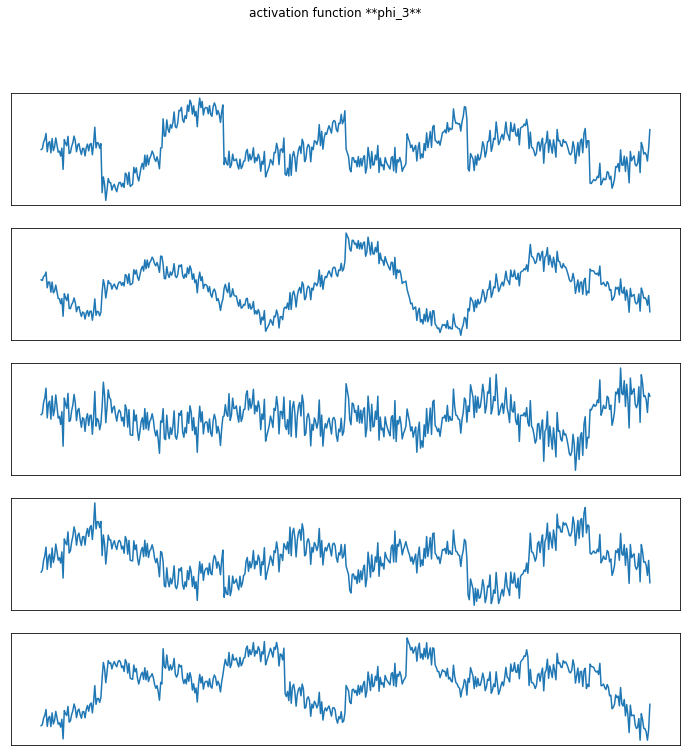

In [93]:
W_estimates = [ICA(Xw, activation_function=phi,learning_rate=0.49) for phi in activation_functions]

for i,W_est in enumerate(W_estimates):
    s = np.dot(W_est, Xw)
    plot_signals(s,"activation function **phi_"+str(i)+"**")

In [95]:
import time
def does_whitening_make_a_difference():
            
    t1_b = time.time()
    [ICA(X, activation_function=phi) for phi in activation_functions]
    t1_a = time.time()
    diff1 = t1_a - t1_b
    
    t2_b = time.time()
    [ICA(Xw, activation_function=phi) for phi in activation_functions]
    t2_a = time.time()
    diff2 = t2_a - t2_b
    

    if diff2 < diff1:
        print("Whiten data converges in atleast " + str(diff2) + " sec faster")
        return True
    print("Nope")
    return False

In [96]:
assert type(does_whitening_make_a_difference()) == bool

gradient 9.861036809570234e-05 ,iterations999: 
gradient 9.68634688936334e-05 ,iterations1999: 
gradient 9.464003527576712e-05 ,iterations2999: 
gradient 9.205627030264226e-05 ,iterations3999: 
gradient 8.922405638725893e-05 ,iterations4999: 
gradient 8.624334541205317e-05 ,iterations5999: 
gradient 8.319796691121419e-05 ,iterations6999: 
gradient 8.015442072312805e-05 ,iterations7999: 
gradient 7.716287478438987e-05 ,iterations8999: 
gradient 7.425952832452769e-05 ,iterations9999: 
gradient 7.146961436628979e-05 ,iterations10999: 
gradient 6.881049870031984e-05 ,iterations11999: 
gradient 6.629451522810942e-05 ,iterations12999: 
gradient 6.393132581740674e-05 ,iterations13999: 
gradient 6.172969813432955e-05 ,iterations14999: 
gradient 5.9698663208184276e-05 ,iterations15999: 
gradient 5.78480573154045e-05 ,iterations16999: 
gradient 5.6188482789224e-05 ,iterations17999: 
gradient 5.4730750454846594e-05 ,iterations18999: 
gradient 5.34848998614187e-05 ,iterations19999: 
gradient 5.245

### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [85]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

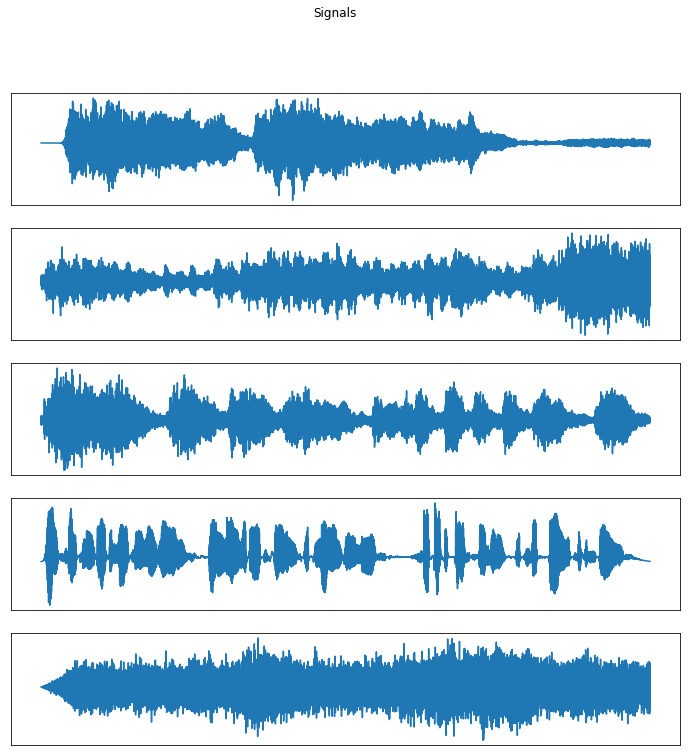

In [86]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

Signals

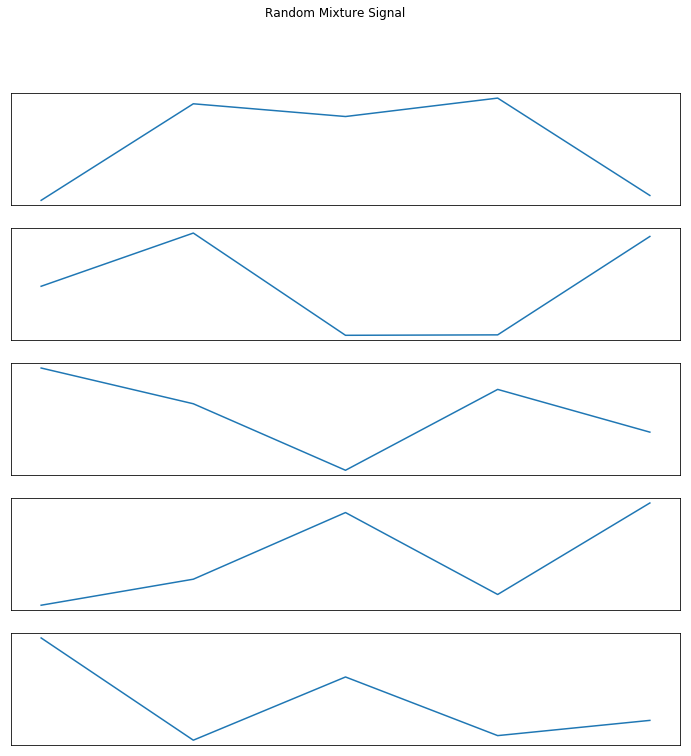

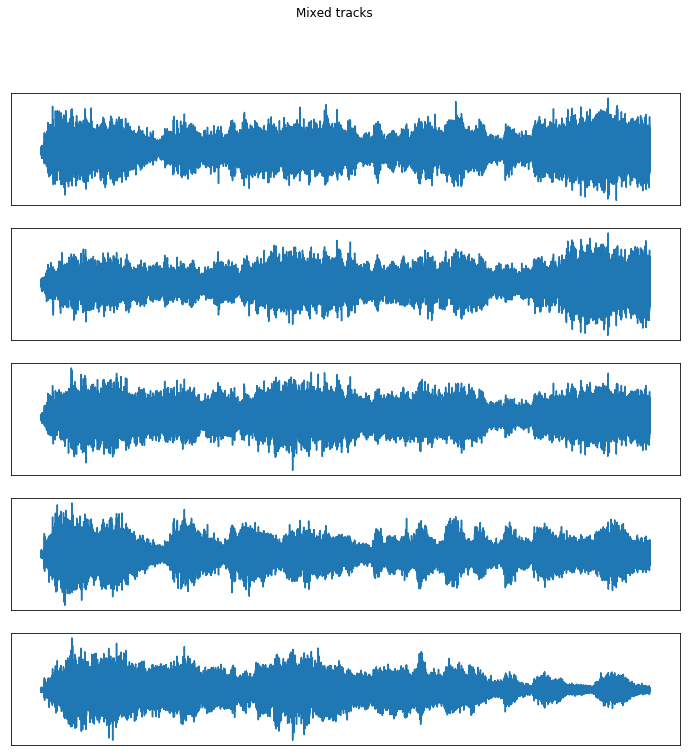

In [88]:
### 1.9 Audio demixing
# YOUR CODE HERE
# A_audio = random_nonsingular_matrix(d=S_audio.shape[0])
# X_audio = make_mixtures(S_audio, A_audio)
# print(X_audio.shape)
# plot_signals(X_audio, "Mixtures")

np.random.seed(50)
A_audio = random_nonsingular_matrix(d=S_audio.shape[0])
X_audio = make_mixtures(S_audio, A_audio)

plot_signals(A_audio,title="Random Mixture Signal")

plot_signals(X_audio,title="Mixed tracks")
play_signals(X_audio, sample_rate)

/home/tarun/miniconda3/envs/ai/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


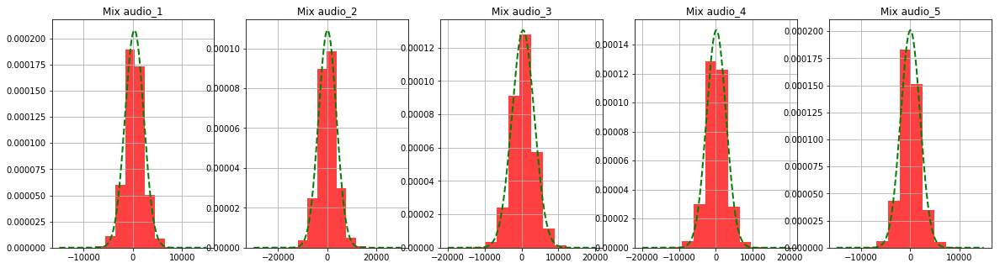

In [89]:
plot_histograms(X_audio,title='Mix audio')
plt.show()
plt.close()

0
100
200
300
400
500
600
700
800
900
gradient 1.1373808490115123e-05 ,iterations999: 
1000
Done!! Took 1019 iterations to converge
Final Gradient 9.960274535066282e-06



Signals

0
100
200
Done!! Took 225 iterations to converge
Final Gradient 9.963819219035225e-06



Signals

0
100
Done!! Took 195 iterations to converge
Final Gradient 9.9825021041658e-06



Signals

0
100
200
300
400
500
600
700
800
900
gradient 2.3294027818863194e-05 ,iterations999: 
1000
1100
Done!! Took 1142 iterations to converge
Final Gradient 9.979741015277087e-06



Signals

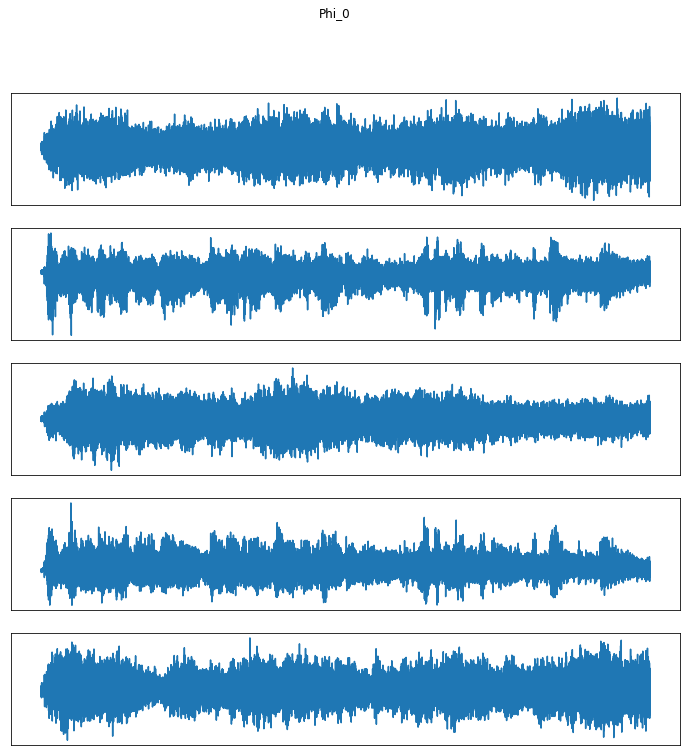

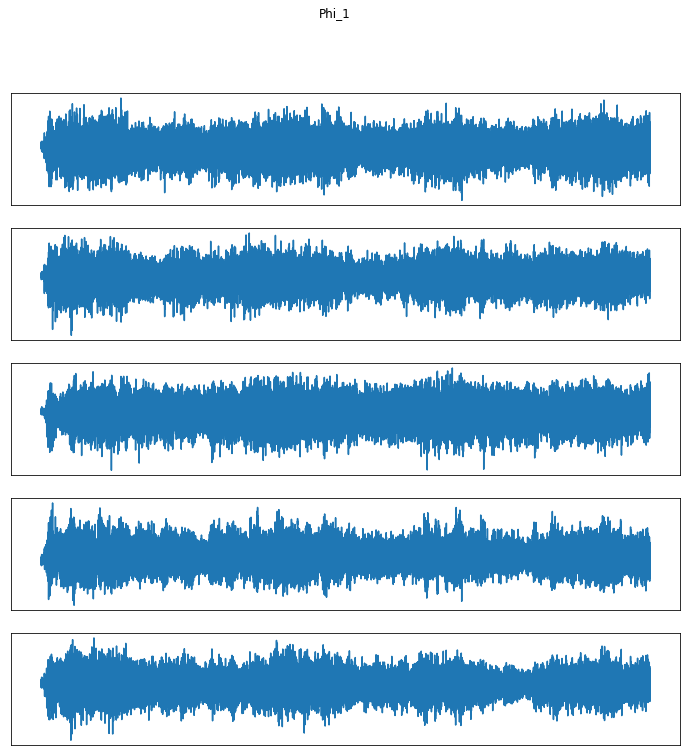

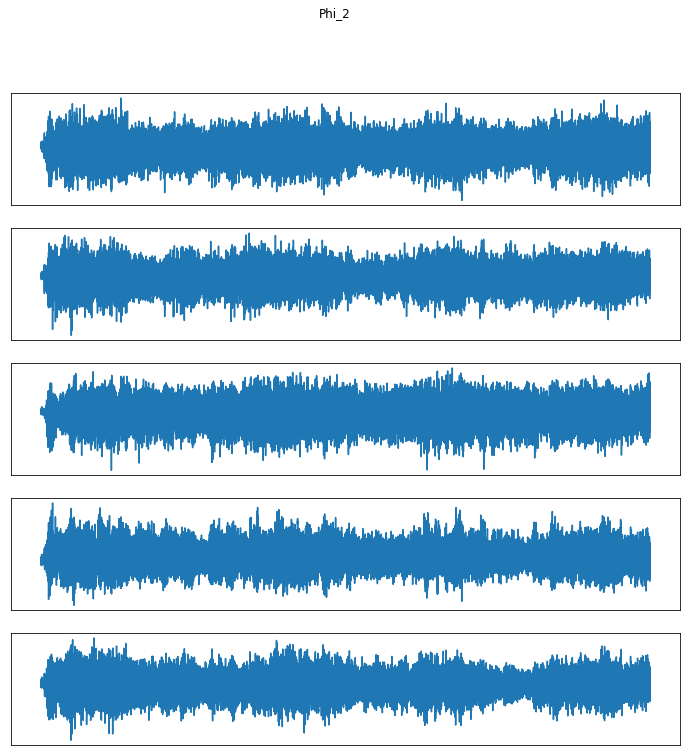

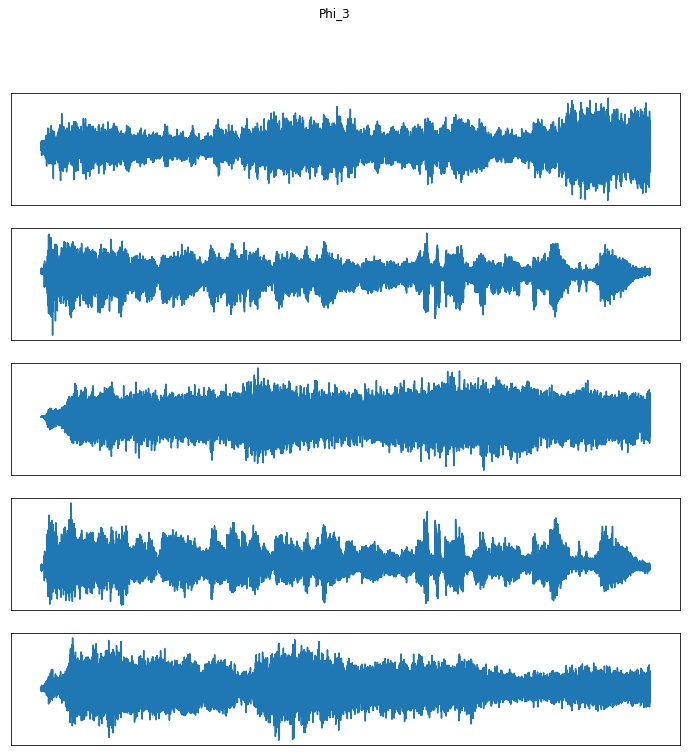

In [38]:
Xw_audio = whiten(X_audio)

l_rate = [0.0035,0.49,0.49,0.003]

for i,phi in enumerate(activation_functions):
    W_est = ICA(Xw_audio, activation_function=phi,learning_rate=l_rate[i])
    s = np.dot(W_est, Xw_audio)
    plot_signals(s,"Phi_"+str(i))
    play_signals(s, sample_rate)

Report your results. Using which activation functions ICA recovers the sources?

YOUR ANSWER HERE

Using activation $\phi_0(a) = -\tanh(a)$ and $\phi_3(a) = -\frac{6a}{a^2 + 5}$ the sources could be recovered(partially).

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

YOUR ANSWER HERE


YOUR ANSWER HERE



**1**
$$p(a) \propto \frac{1}{ cosh(a)}$$
$$ \int_{-\infty}^{\infty} \frac{1}{\cdot cosh(a)} da = \pi $$
$$\Rightarrow p(a) = \frac{1}{\pi \cdot cosh(a)} $$
Let's calculate the $\mu$ ofthe function
$$\mu = \int_{-\infty}^{\infty} a \cdot p(a) da = 0 $$
$$\operatorname{E}[(X-\mu)^{4}]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{4}dx$$
$$=\frac{5\pi^{4}}{16}$$
$$\operatorname{E}[(X-{\mu})^2]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{2}dx$$
$$=\frac{\pi^{2}}{4}$$
$$Kurt[X]=\frac{5\pi^{4}}{16}\frac{16}{\pi^{4}}-3$$
$$Kurt[X]=2$$

Now on w'll follow the same procedure as above

**2**
$$p_1(a) \propto cosh(a) \cdot \exp{(\frac{-a^{2}}{2}}) $$
$$\int_{-\infty}^{\infty} cosh(a) \exp{(\frac{-a^{2}}{2}})=\sqrt{2e\pi}$$
$$p_1(a) =\frac{1}{\sqrt{2e\pi}} cosh(a) \cdot \exp{(\frac{-a^{2}}{2}}) $$
$$\mu = \int_{-\infty}^{\infty} a \cdot p(a) da = 0$$
$$\operatorname{E}[(X-\mu)^{4}]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{4}dx$$
$$=10$$
$$\operatorname{E}[(X-{\mu})^2]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{2}dx$$
$$=2$$
$$Kurt[X]=\frac{10}{2^{2}}-3=-0.5$$

**3**
$$p_2(a) \propto e^{\frac{-a^4}{4}} $$
$$ p_2(a) = \frac{\sqrt{2}}{\Gamma(1/4)}e^{\frac{-a^4}{4}}$$
$$\mu = \int_{-\infty}^{\infty} a \cdot p(a) da = 0$$
$$\operatorname{E}[(X-\mu)^{4}]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{4}dx$$
$$=\dfrac{3{\cdot}2^\frac{7}{2}\sqrt{{\pi}}}{\operatorname{\Gamma}\left(\frac{1}{4}\right)}
$$
$$\operatorname{E}[(X-{\mu})^2]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{2}dx$$
$$=\dfrac{2^\frac{5}{2}\sqrt{{\pi}}}{\operatorname{\Gamma}\left(\frac{1}{4}\right)}$$
$$Kurt[X]=\frac{\Gamma(\frac{1}{4})3}{\sqrt{2\pi}}-3=$$

**4**
$$p_3(a) \propto (a^2 + 5)^{-3} $$
$$ p_2(a) = \frac{200 \sqrt{5}}{3\pi} (a^2 + 5)^{-3} $$
$$\mu = \int_{-\infty}^{\infty} a \cdot p(a) da = 0$$
$$\operatorname{E}[(X-\mu)^{4}]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{4}dx$$
$$=25
$$
$$\operatorname{E}[(X-{\mu})^2]=\int_{-\infty}^{\infty}p(x)(x-\mu)^{2}dx$$
$$=\dfrac{5}{3}$$
$$Kurt[X]=3$$

In [83]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]
    p0_mu = 0
    p0_u4 = 5 * np.pi ** 4 / 16
    p0_sigma4 = (np.pi ** 2 / 4) ** 2
    kurtosis_0 = p0_u4 / p0_sigma4 - 3
    
    p1_mu = 0
    p1_u4 = 10
    p1_sigma4 = 2 ** 2
    kurtosis_1 = p1_u4 / p1_sigma4 - 3
    
    p2_mu = 0
    p2_u4 = (3*(2**(7/2))*np.sqrt(np.pi))/math.gamma(1/4)
    p2_sigma4 = ((np.sqrt(np.pi)*2**(5/2))/math.gamma(1/4))**2
    kurtosis_2 = p2_u4 / p2_sigma4 - 3
    
    p3_mu = 0
    p3_u4 = 25
    p3_sigma4 = (5 / 3) ** 2
    kurtosis_3 = p3_u4 / p3_sigma4 - 3          
    
    return [kurtosis_0, kurtosis_1, kurtosis_2, kurtosis_3]
    # YOUR CODE HERE
    raise NotImplementedError()
    

In [ ]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [ ]:
### 1.10.2 Excess Kurtosis
# YOUR CODE HERE
import scipy.stats

Kurtosis_S = scipy.stats.kurtosis(S, axis = 1, fisher = True)
Kurtosis_S_audio = scipy.stats.kurtosis(S_audio, axis = 1, fisher = True)

print("Kurtosis of different synthetic signals: ", Kurtosis_S)
print("Kurtosis of different real signals: ", Kurtosis_S_audio)

print()

print("Mean of Kurtosis of different synthetic signals: ", np.mean(Kurtosis_S))
print("Mean of Kurtosis of different real signals: ", np.mean(Kurtosis_S_audio))


YOUR ANSWER HERE
Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution.

Lets consider the first activation function and the corresponding kurtosis of the prior, i.e $\phi_0(a) = -\tanh(a)$ and Kurtosis of prior 1.99. This implies the distribution of prior is more peaked than standard normal distribution, observation close to the median are more frequent and fat tailed. However, the Kurtosis of systhetic signals are negative implies they are less peaked and less fat tailed. Thus our assumed prior distribution or the activation function are not a good approximation of the actual synthetic signals. On the other hand, the Kurtosis of real signals are positive and the prior seems to be a good approximation of the real signals. Thus activation function $\phi_0(a) = -\tanh(a)$ performs well in case of real signals as compared to synthetic signals.

Similarly, considering the second activation and corresponding kurtosis of the prior, i.e $\phi_1(a) = -a + \tanh(a)$ and Kurtosis -0.5, the activation fuctions perfoms well in the synthetic signals than real signals. The distribution of the synthetic signal source is similar to the assumed prior.

Therefore, we can conclude that activation function $\phi_0(a) = -\tanh(a)$ and $\phi_3(a) = -\frac{6a}{a^2 + 5}$ performs well in case of real signals whereas $\phi_1(a) = -a + \tanh(a)$ and $\phi_2(a) = -a^3$ performs better on the synthetic data.